In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
import plotting_scripts as ps

In [5]:
from paperII import load
from cr_zprof import cr_data_load

[1783440523.598525] [stellar-vis1:222911:0]        ib_iface.c:1231 UCX  ERROR mlx5_0: ibv_create_cq(cqe=4096) failed: Cannot allocate memory : Please set max locked memory (ulimit -l) to 'unlimited' (current: 64 kbytes)
[1783440523.598540] [stellar-vis1:222911:0]      ucp_worker.c:1415 UCX  ERROR uct_iface_open(rc_verbs/mlx5_0:1) failed: Input/output error


[stellar-vis1.princeton.edu:222911] pml_ucx.c:309  Error: Failed to create UCP worker


In [6]:
basedir = "/scratch/gpfs/changgoo/tigress_classic/"
model_dict = cr_data_load(basedir,'*b1-*Vmax2-rst')
model_dict.update(cr_data_load(basedir,'*va1'))

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma27_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va1


In [7]:
model_dict

{'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst',
 'crmhd-8pc-b1-diode-lngrad_out-sigma27_va1': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma27_va1',
 'crmhd-8pc-b1-diode-lngrad_out-sigma28_va1': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma28_va1',
 'crmhd-8pc-b1-diode-lngrad_out-sigma29_va1': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma29_va1'}

In [8]:
group="vAi"

In [9]:
simgroup, model_name, model_color = load(model_dict,
                                         "all",
                                         tslice=slice(270,500),
                                         colors=["#E77500","xkcd:teal","xkcd:coral","xkcd:indigo"],
                                         verbose=False)

[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst --> crmhd: crmhd


[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma27_va1 --> sigma27-vAi: σ27
Renamed crmhd-8pc-b1-diode-lngrad_out-sigma28_va1 --> sigma28-vAi: σ28


[FindFiles-WARNING] rst files in out_fmt but not found.


Renamed crmhd-8pc-b1-diode-lngrad_out-sigma29_va1 --> sigma29-vAi: σ29
loading crmhd...
loading sigma27-vAi...
loading sigma28-vAi...
loading sigma29-vAi...
Loaded crmhd in group all with name crmhd and color #E77500
Loaded sigma27-vAi in group all with name σ27 and color xkcd:teal
Loaded sigma28-vAi in group all with name σ28 and color xkcd:coral
Loaded sigma29-vAi in group all with name σ29 and color xkcd:indigo


In [10]:
for m, s in simgroup["all"].items():
    if s.options["cosmic_ray"]:
        zp_pp = s.load_zprof_postproc()

In [11]:
model_name

{'crmhd': 'crmhd',
 'sigma27-vAi': 'σ27',
 'sigma28-vAi': 'σ28',
 'sigma29-vAi': 'σ29'}

In [12]:
simgroup[group] = {m:s for m,s in simgroup["all"].items() if m != "crmhd"}

In [13]:
simgroup

{'all': {'crmhd': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x14646621e2d0>,
  'sigma27-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b607d0>,
  'sigma28-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b605c0>,
  'sigma29-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b606e0>},
 'vAi': {'sigma27-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b607d0>,
  'sigma28-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b605c0>,
  'sigma29-vAi': <load_sim_tigresspp.LoadSimTIGRESSPP at 0x146452b606e0>}}

In [14]:
ps.setup(f"../{group}_figures", model_name, model_color)

crmhd sfr40 0.0035970609783096126 0.0011778264390705573
σ27 sfr40 0.002358366995949532 0.0013874302812672346
σ28 sfr40 0.0028914728628512457 0.0012815730804987032
σ29 sfr40 0.003930672690473319 0.0010990335193823981
crmhd Sigma_gas 7.856706284548293 9.890343811315356
σ27 Sigma_gas 7.779532686306756 9.977022592958892
σ28 Sigma_gas 7.492608229519377 9.84925688951317
σ29 Sigma_gas 7.976735759319437 9.982989866906053
crmhd Sigma_out 1.0852702355157413 2.3678779846034477
σ27 Sigma_out 0.25916955711417256 1.8604993138661914
σ28 Sigma_out 1.3356150671463958 2.9979230519588542
σ29 Sigma_out 0.21786988902343393 1.2359946127170616


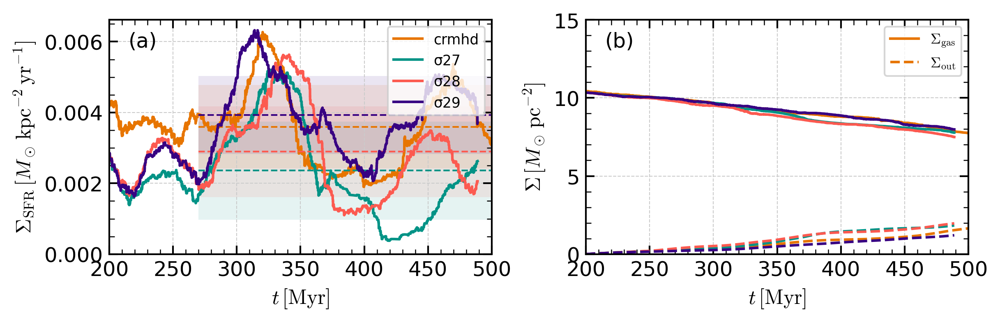

In [15]:
f = ps.plot_history(simgroup,"all",tmin=200,tmax=500)

crmhd Pok_cr 12004.469112702483 12053.830198920405
crmhd 696.2698476366196
crmhd Pok_th 3801.2754615858585 3675.9005585638306
crmhd 220.47734569641204
crmhd Pok_kin 13014.348699492839 13093.416381477246
crmhd 754.8437586879478
crmhd Pi_B 1124.619534883126 1115.2068561676722
crmhd 65.22892973031774
σ27 Pok_cr 14224.334892297033 14226.274782263159
σ27 1258.354509888636
σ27 Pok_th 2788.450010006298 2544.4158361963196
σ27 246.67997992585256
σ27 Pok_kin 8414.051938545772 8227.508175151193
σ27 744.3483497453356
σ27 Pi_B 492.49751711370646 441.7163531276562
σ27 43.56874865935537
σ28 Pok_cr 14319.293858897898 14544.348568851334
σ28 1033.2012213022576
σ28 Pok_th 3313.1504345786775 3153.028162032959
σ28 239.05865115252703
σ28 Pok_kin 10934.726914423072 10880.473317735594
σ28 788.9895489202659
σ28 Pi_B 555.9665604856547 575.8661914669485
σ28 40.115478804846965
σ29 Pok_cr 6962.342087033425 7177.8100985855035
σ29 369.54804282869657
σ29 Pok_th 4344.232853354798 4176.313078561505
σ29 230.583721466267

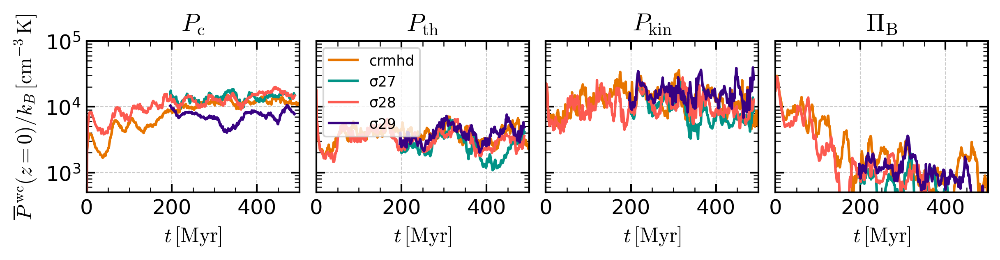

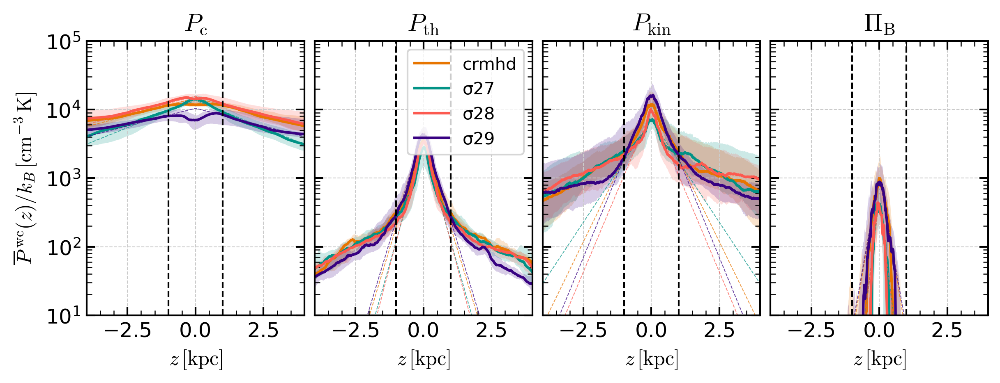

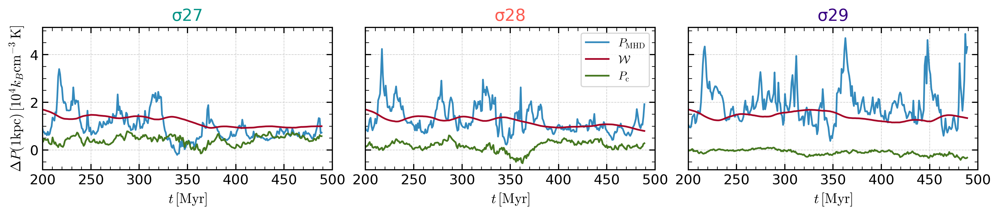

In [16]:
f=ps.plot_pressure_t(simgroup, "all", zslice=slice(-50,50), tmax=500)
f=ps.plot_pressure_z(simgroup, "all")
f=ps.plot_vertical_equilibrium_t(simgroup, group, tmin=200, zmax=1000)

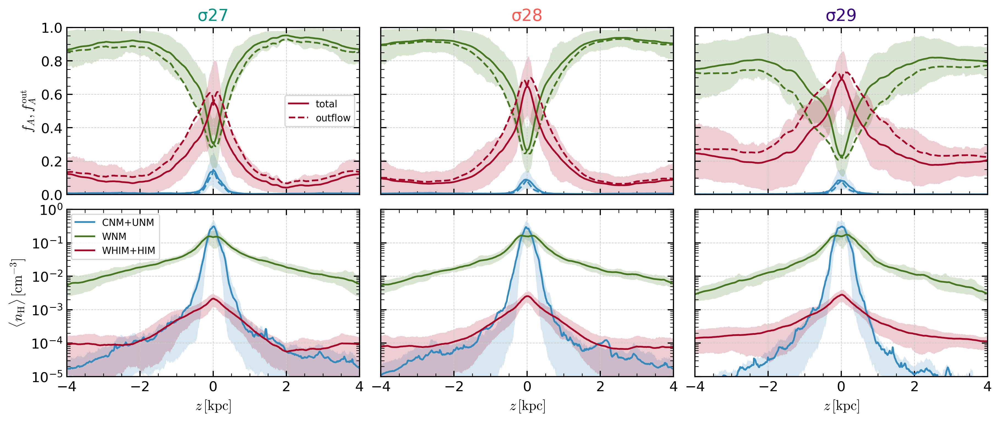

In [17]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

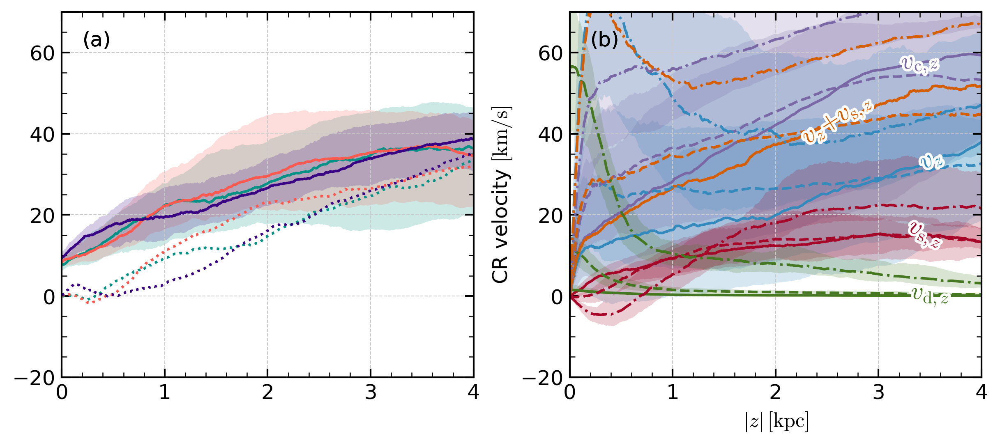

In [18]:
f = ps.plot_cr_velocity_z(simgroup, group, both=True)

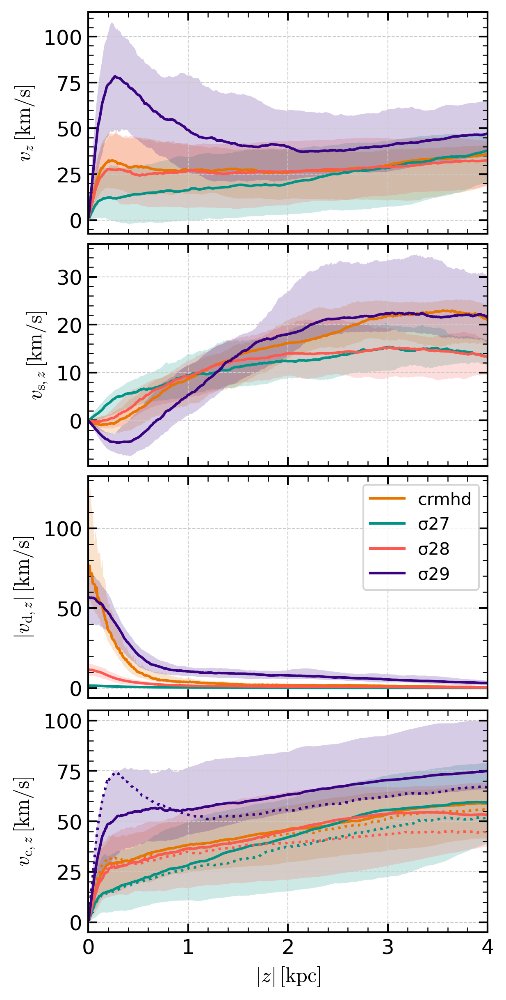

In [27]:
# ps.setup(f"../{group}_figures", model_name, model_color)
f = ps.plot_cr_velocity_z_all(simgroup, "all")

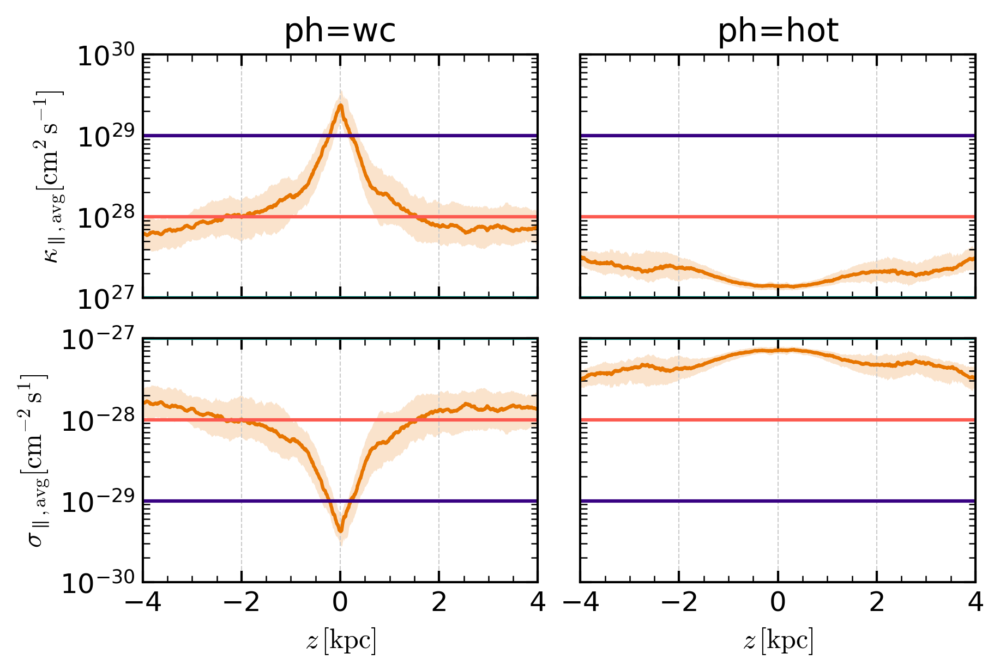

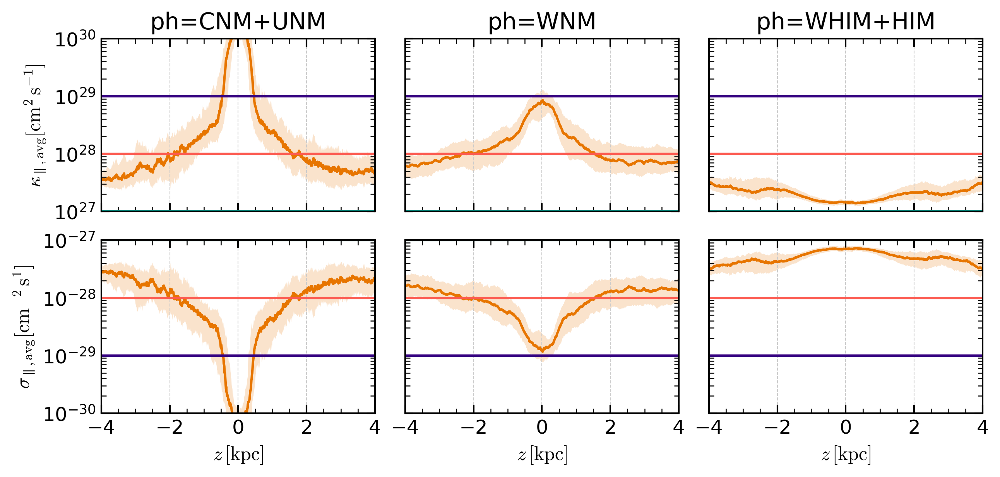

In [20]:
f=ps.plot_kappa_z(simgroup, "all")
f=ps.plot_kappa_z(
    simgroup,
    "all",
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
)

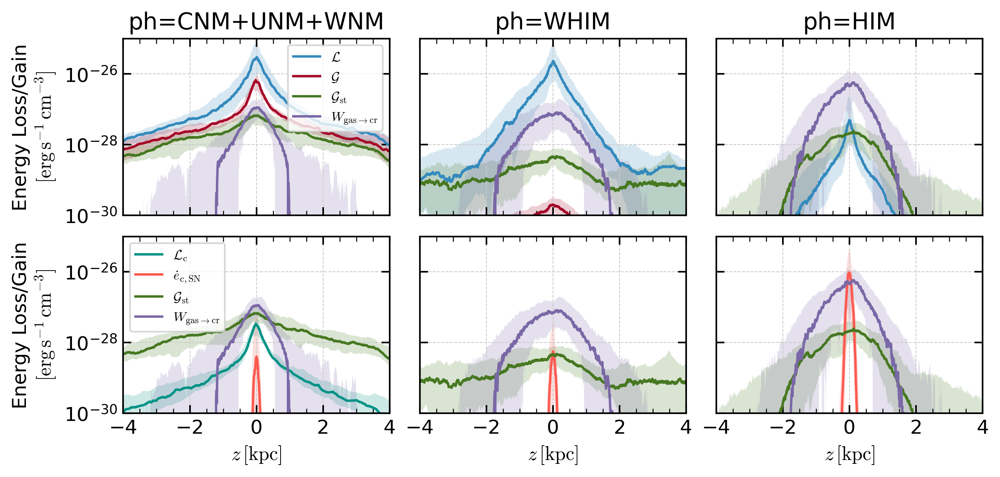

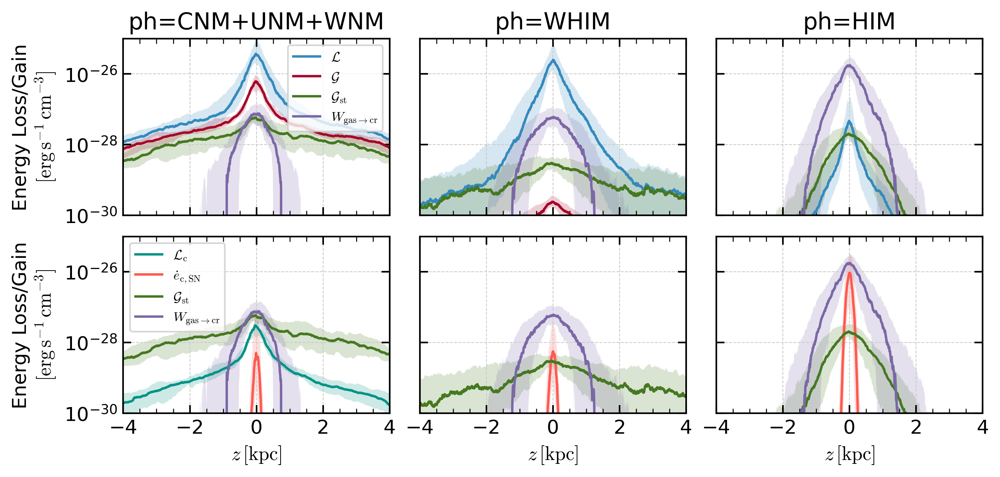

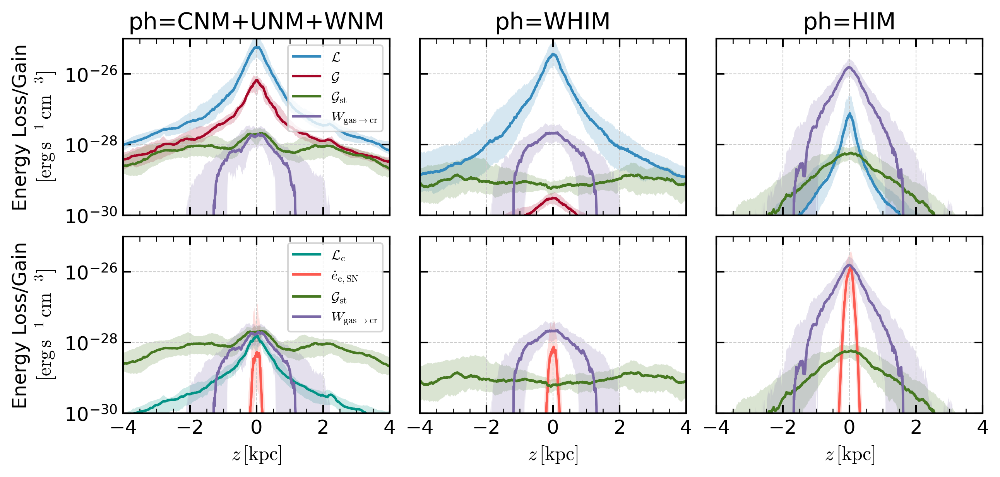

In [21]:
for m, s in simgroup[group].items():
    ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

(200.0, 500.0)

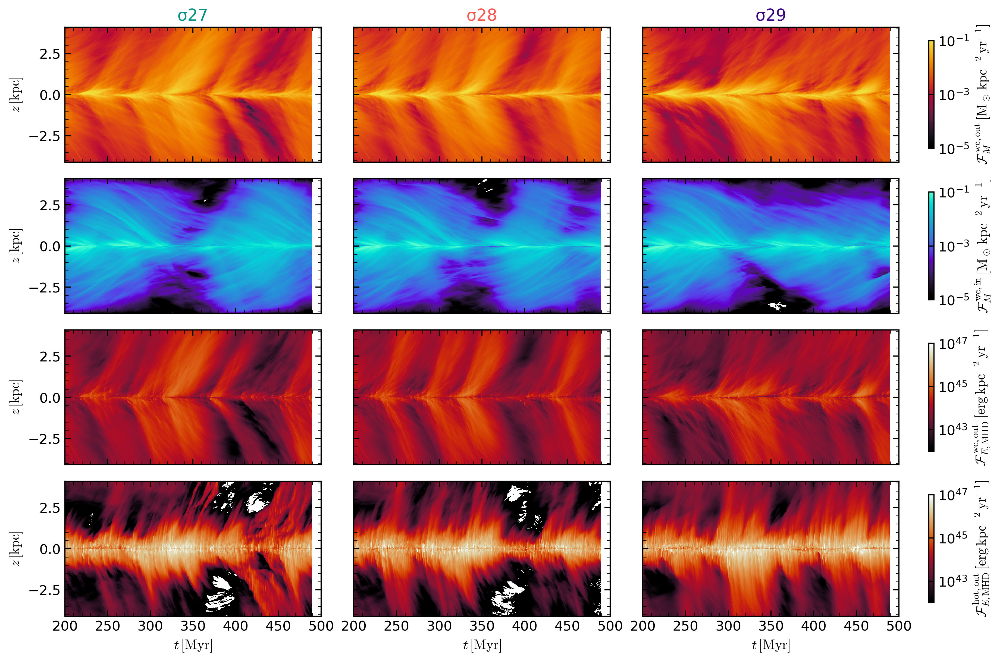

In [22]:
f=ps.plot_flux_tz(simgroup, group)
f.axes[0].set_xlim(200,500)

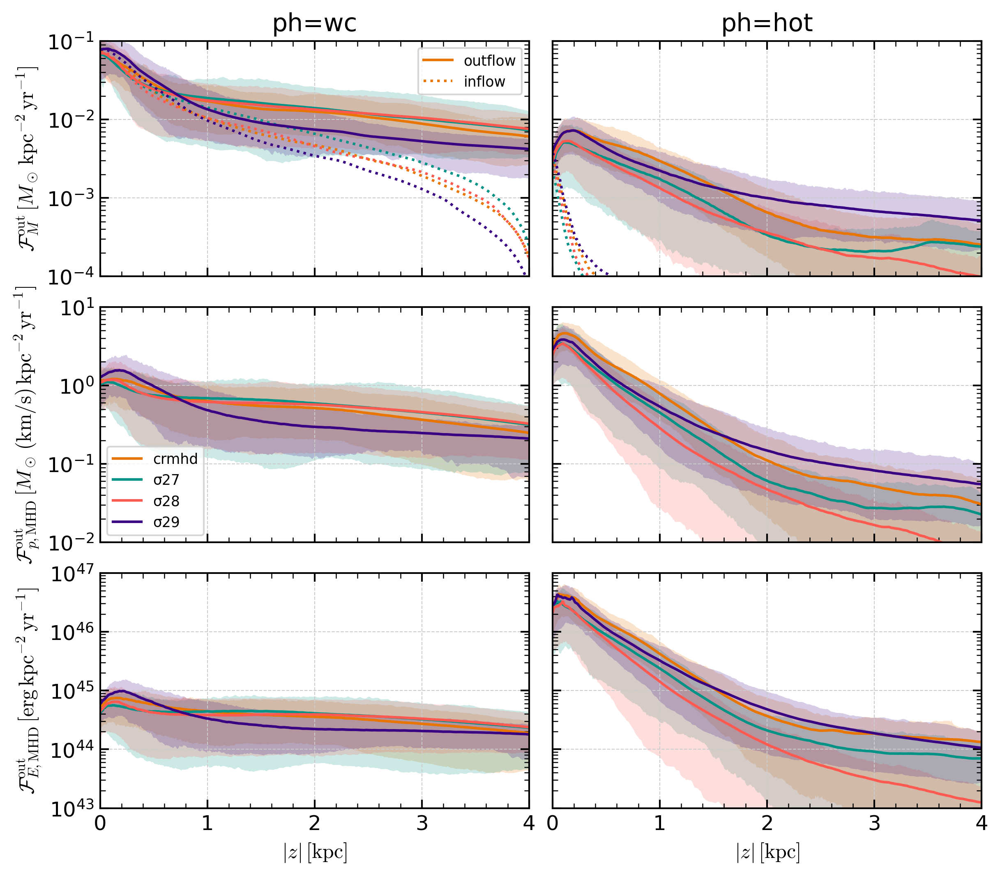

In [23]:
f=ps.plot_flux_z(simgroup, "all", vz_dir=1, both=True)

crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.92978804 2.67700478 2.37148174 2.01168133 1.70768031], eta_p_MHD=[0.73273951 0.35463613 0.15497164 0.09484688 0.05811078], eta_E_MHD=[0.39380598 0.11879489 0.01759594 0.01135197 0.00845682]
crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.87808943 0.94199653 0.81172842 0.65565065 0.5716168 ], eta_E_CR=[0.27635137 0.35587952 0.3647082  0.33640089 0.31415506]
σ27 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.2820022  2.68196178 3.2813441  3.19609581 3.08668814], eta_p_MHD=[0.85825549 0.49466617 0.26515368 0.17300234 0.10796911], eta_E_MHD=[0.35907336 0.10490334 0.0213458  0.01553045 0.01208277]
σ27 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[1.38194288 1.24132177 0.89038762 0.6563417  0.52034458], eta_E_CR=[0.3048416  0.35693907 0.34194297 0.31371117 0.29374518]
σ28 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.59623741 2.89

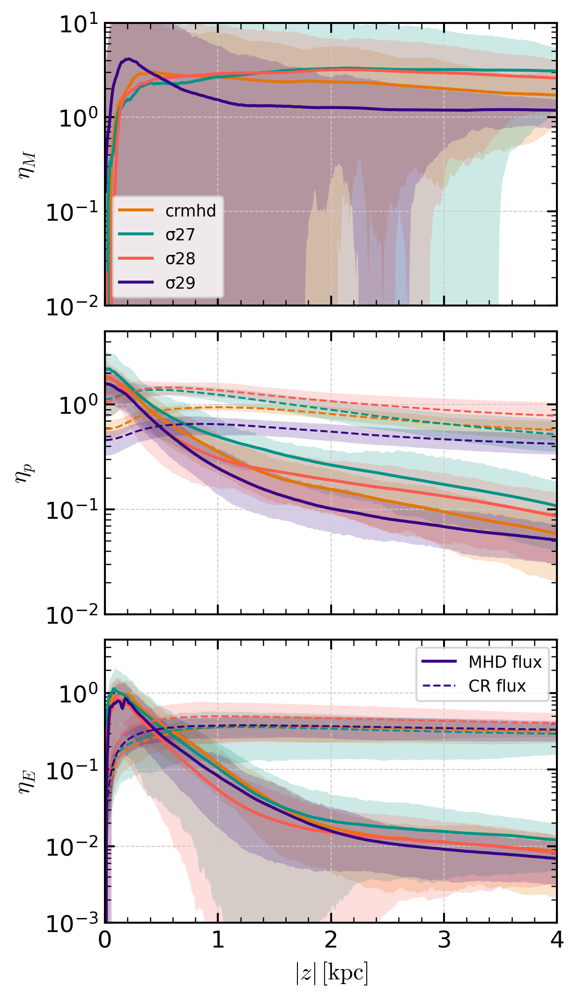

In [24]:
f=ps.plot_loading_z_merged(simgroup, "all", vz_dir=None, both=True)

crmhd 2107.740565822015
σ27 2580.7956176816433
σ28 2129.0915226631328
σ29 1769.1029914318942


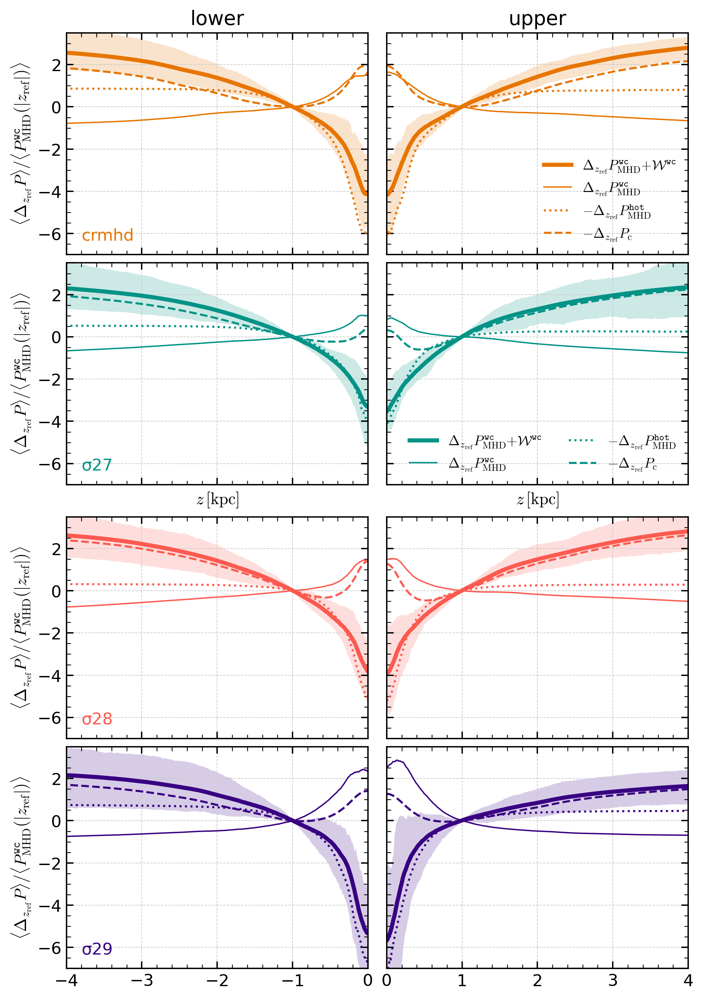

In [25]:
f=ps.plot_momentum_transfer_z(simgroup, "all", show_option=1, zmin=0, zref=1000)
# plt.setp(f.axes,ylim=(-1,3))
# plt.savefig(osp.join(ps.fig_outdir, f"{group}_dflux_1.pdf"))

In [30]:
from cr_zprof import load_windpdf
for m, s in simgroup[group].items():
    load_windpdf(s, both=True)

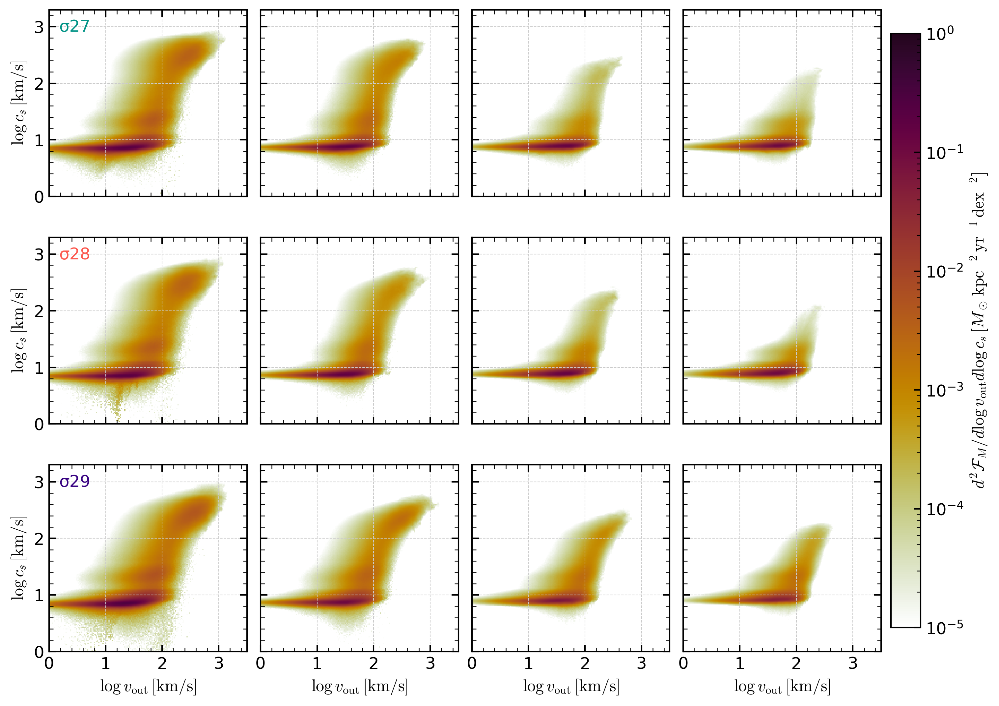

In [31]:
f=ps.plot_jointpdf(simgroup, group)

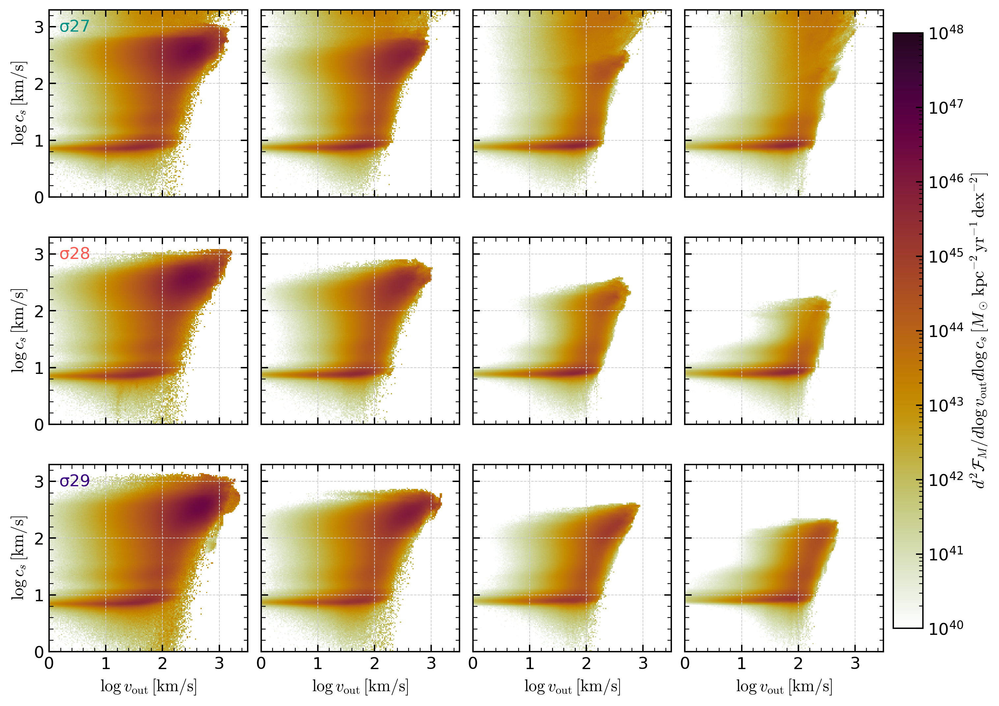

In [32]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

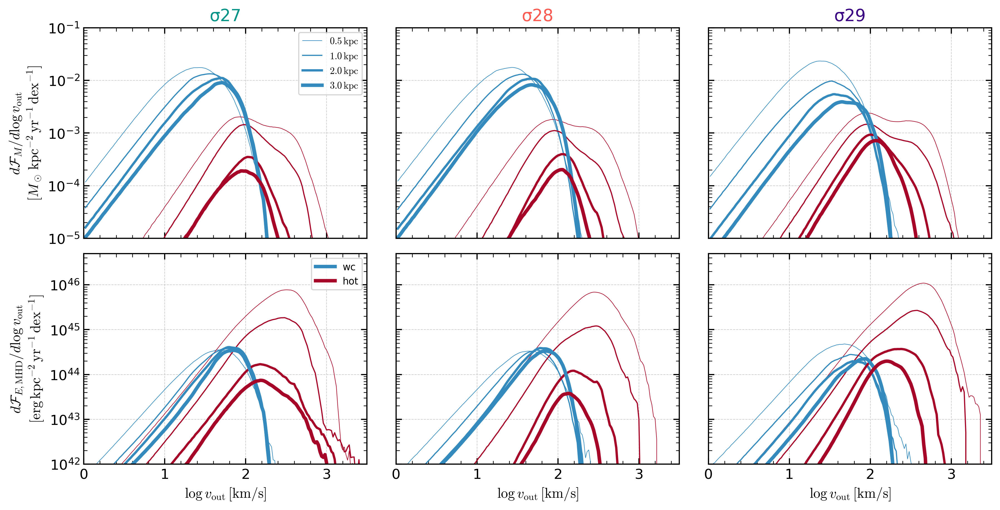

In [33]:
f=ps.plot_voutpdf(simgroup, group)

sinj 8.296297210807936e-05
$F_{\rm in,W}$ 0.23797029353127955 0.31091945323802983
$F_{\rm in,SN}$ 0.11471864353224279 0.11471865973324548
$G_{\rm st}$ 0.03116084894014355 0.04930900842898237
$L_{\rm coll}$ 0.004986674770734253 0.005920664609066327
$F_{\rm out}$ 0.304841596010437 0.35703722728014037
$F_{\rm in}$ 0.3165414133526444 0.3704084399332265
sinj 0.00010171664668136736
$F_{\rm in,W}$ 0.35704132890429247 0.41926315938358144
$F_{\rm in,SN}$ 0.1106102532793189 0.11061027184436772
$G_{\rm st}$ 0.020022455402046377 0.029801624768421124
$L_{\rm coll}$ 0.004269378439068463 0.005130516792735987
$F_{\rm out}$ 0.4519776525730731 0.4997022104505855
$F_{\rm in}$ 0.44335974834249664 0.49494128966679185
sinj 0.00013827376712182655
$F_{\rm in,W}$ 0.2222232279653047 0.2637050281063045
$F_{\rm in,SN}$ 0.11267205612506055 0.11267321746059634
$G_{\rm st}$ 0.005544695083023034 0.008493853331626377
$L_{\rm coll}$ 0.001902802344177079 0.0023472237904437793
$F_{\rm out}$ 0.34283470834277463 0.37667268

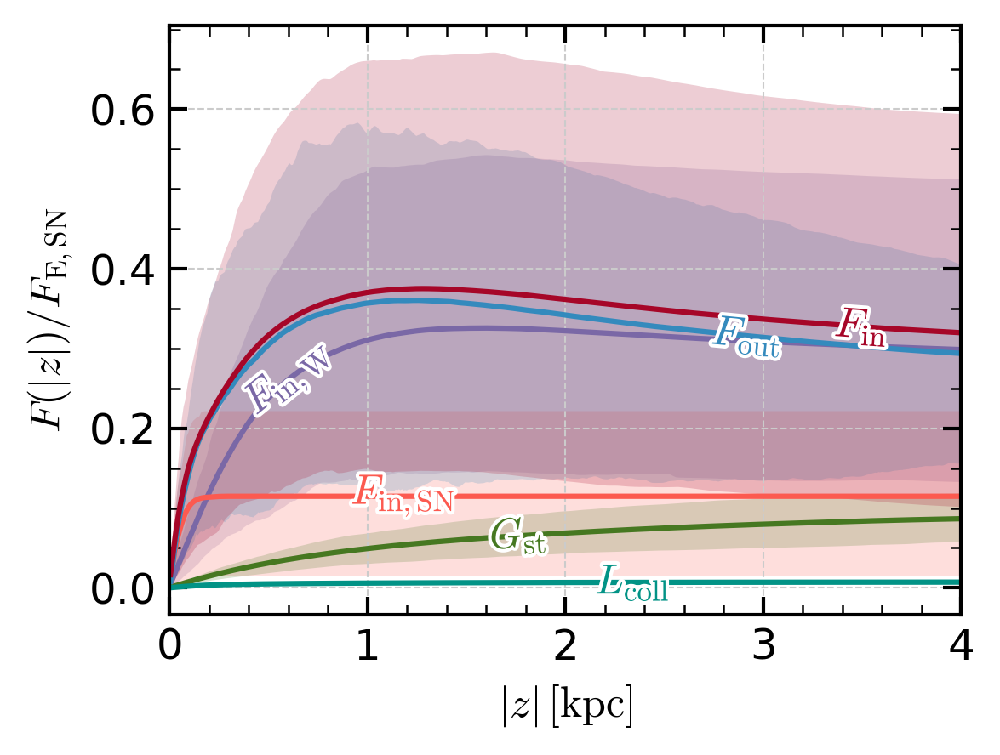

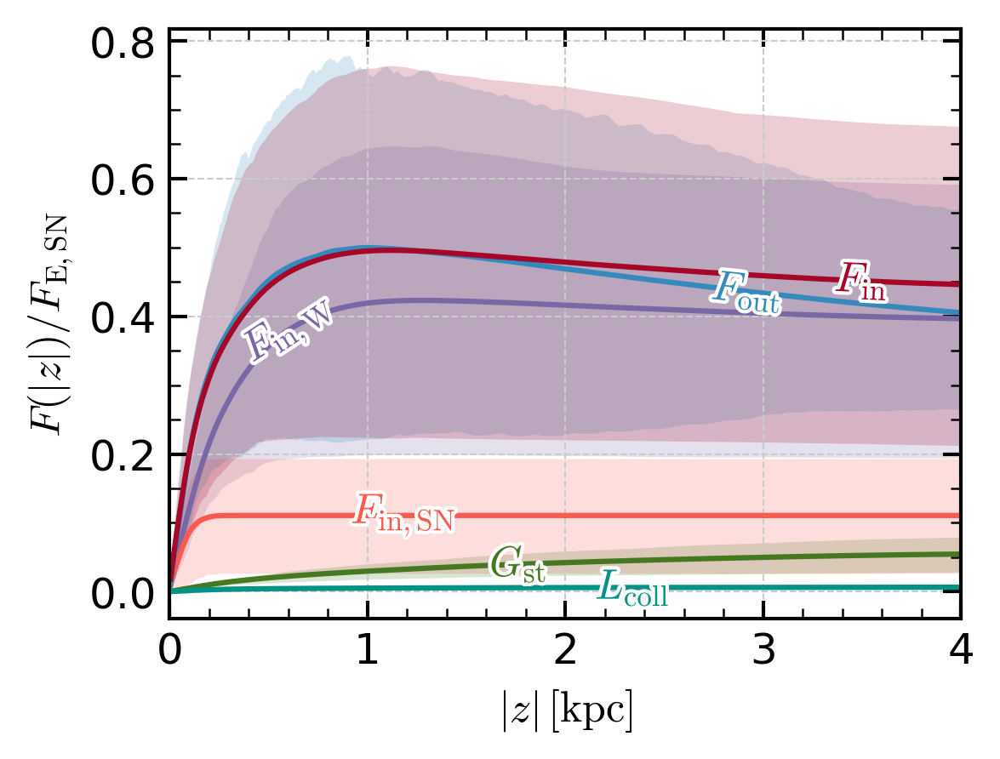

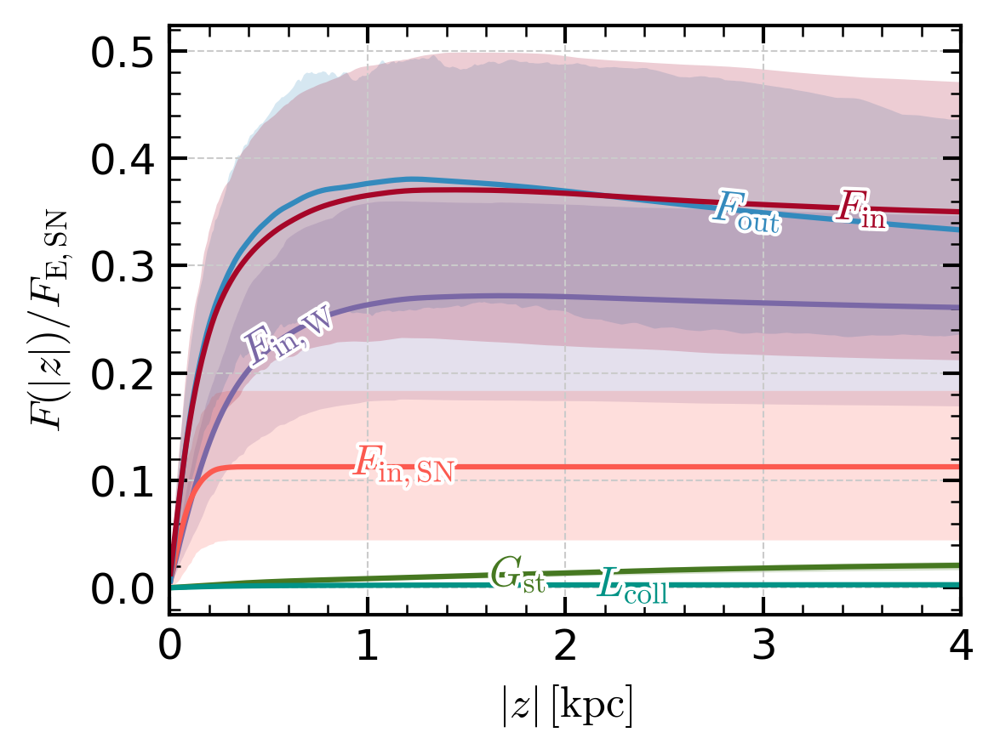

In [34]:
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        ps.plot_crgain_cumsum(s, m)

        # # will not be used in the paper, but just for checking
        # load_velocity_pdfs(s, xf="T")
        # load_kappa_pdfs(s, xf="T", yf="sigma_para")
        # ps.plot_velocity_T(s, m)

In [35]:
s = simgroup["vAi"]["sigma27-vAi"]

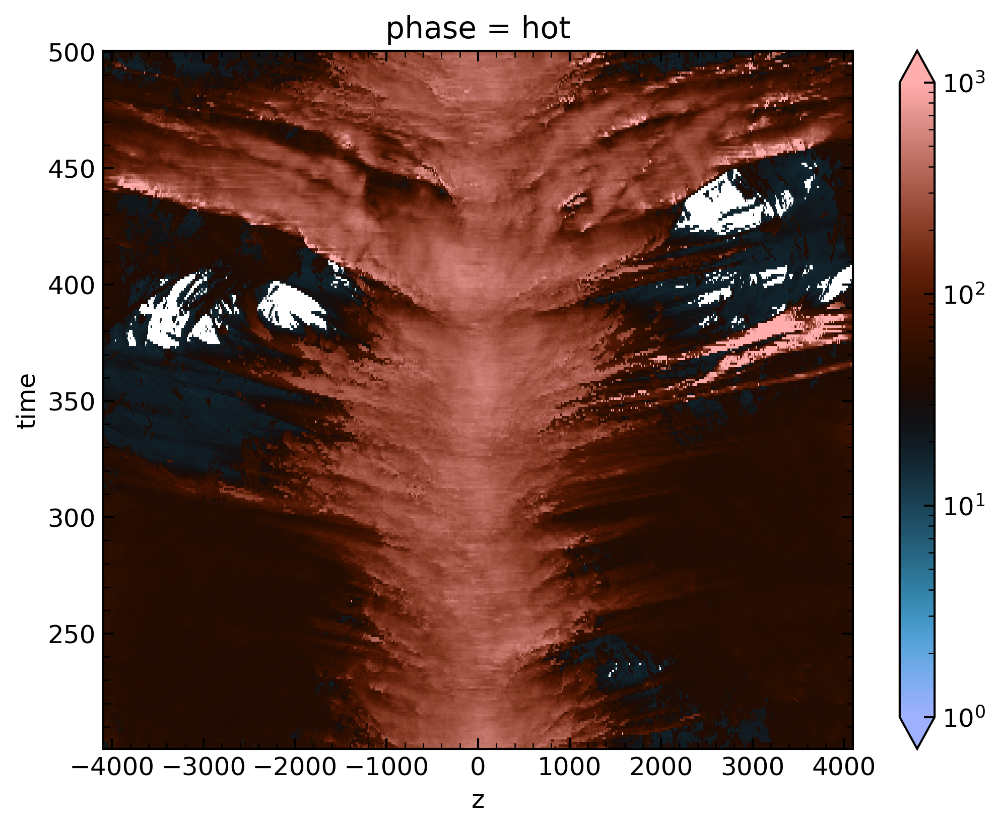

In [36]:
np.sqrt(s.zp_ph["press"]/s.zp_ph["rho"]).sum(dim="vz_dir").sel(phase="hot").plot(norm=LogNorm(1.0,1.e3),cmap=plt.cm.berlin)#.plot(norm=SymLogNorm(1.e8,vmin=-1.e11,vmax=1.e11))

In [128]:
ps.setup(f"../{group}_figures", model_name, model_color)


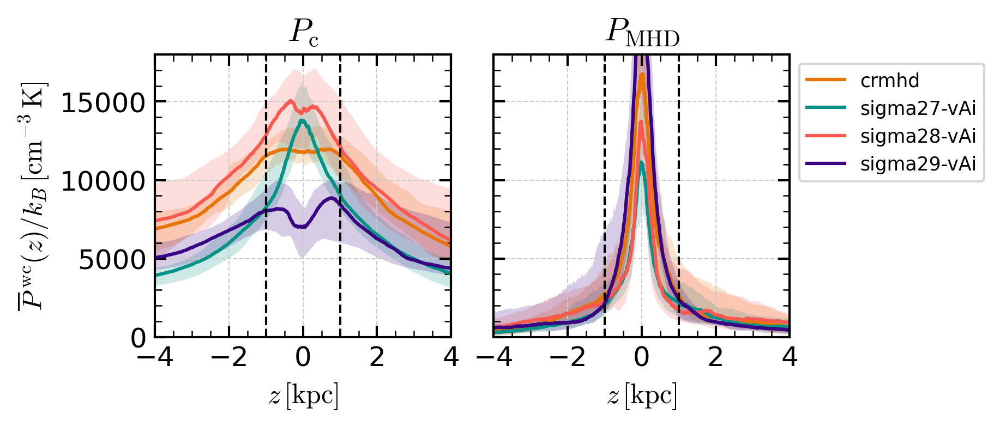

In [129]:
f = ps.plot_pressure_z_talk(simgroup, "all", savefig=False)
plt.setp(f.axes,"ylim",(0,1.8e4))
f.axes[1].legend(fontsize="x-small", bbox_to_anchor=(1,1))
plt.savefig(os.path.join(ps.fig_outdir, f"all_pressures_z_talk_lin.pdf"))

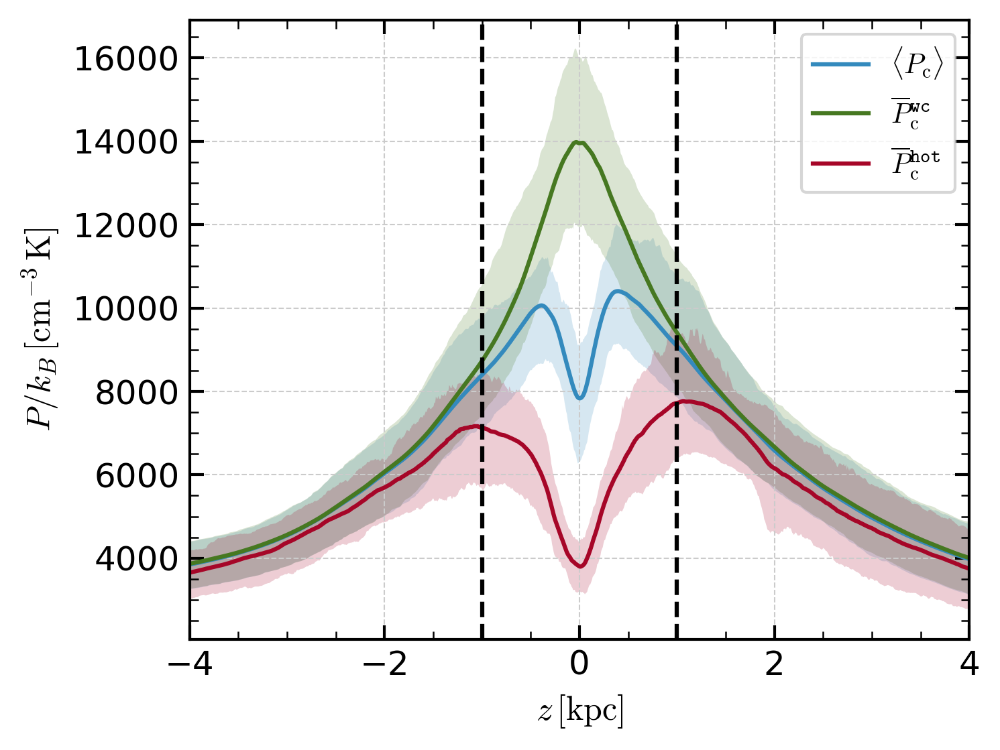

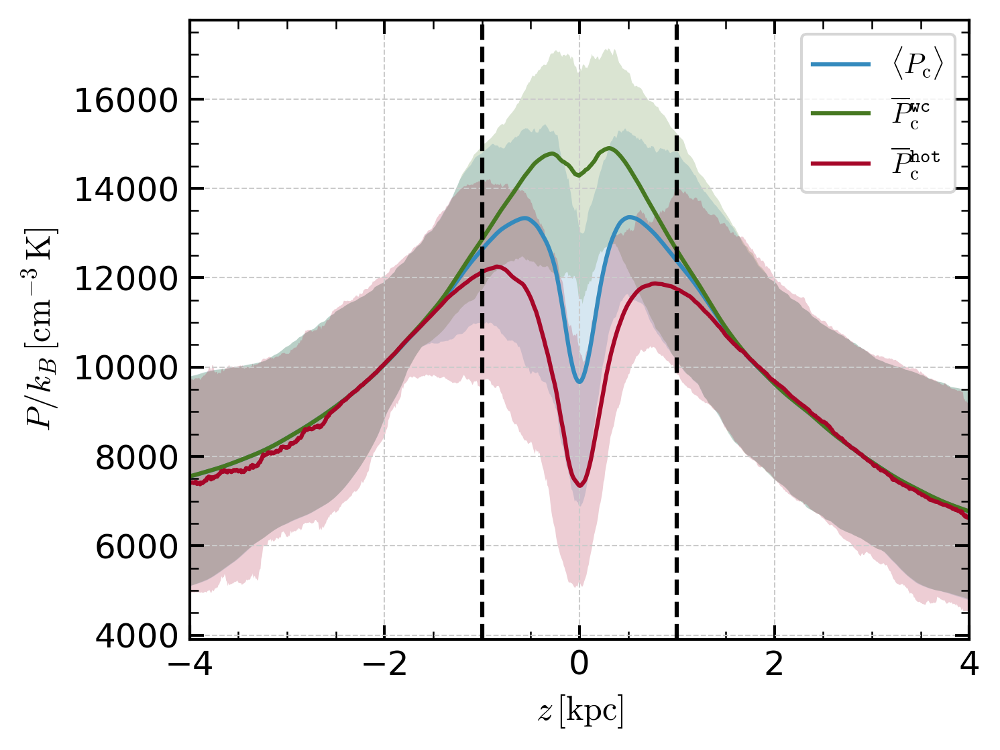

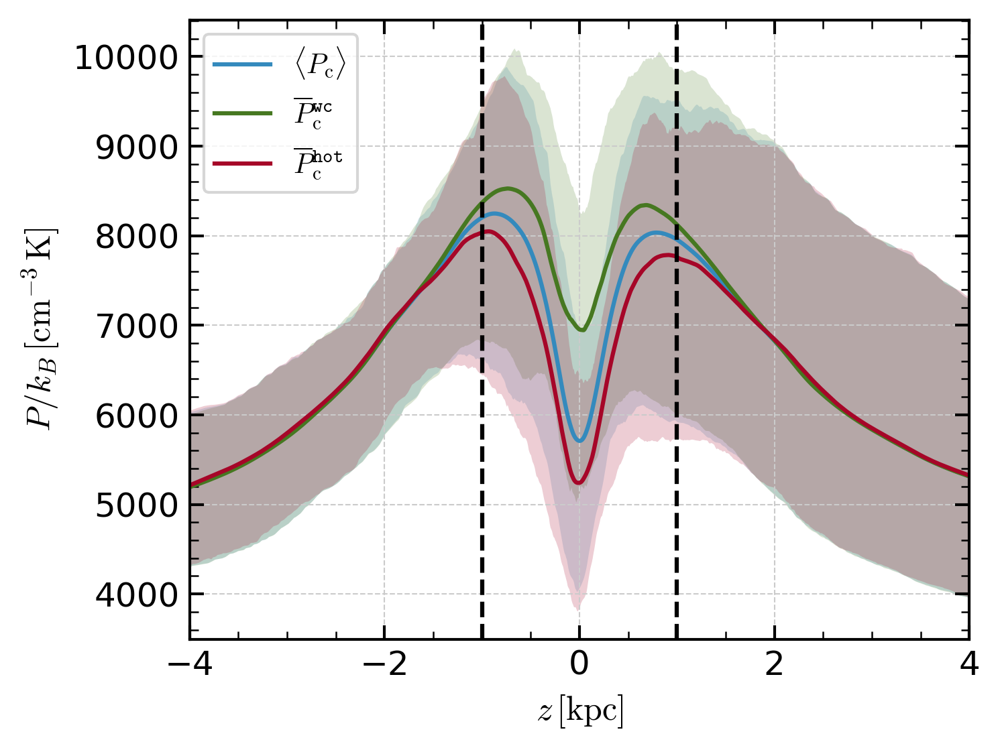

In [130]:
from cr_zprof import update_stress
for m, s in simgroup[group].items():
    name = ps.model_name[m]
    dset = s.zp_ph.sel(time=s.tslice).sum(dim="vz_dir")
    dset = update_stress(s, dset)
    ps.plot_Pcr_lin(dset,name=name)